In [1]:
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
train_file_path = "data/train/"

all_images_file_path = glob(train_file_path + "*/*/*.jpg")

In [3]:
split_file_path = [file.split('/') for file in all_images_file_path]

In [4]:
split_file_path = [file.split('/') for file in all_images_file_path]

train_df = pd.DataFrame({
    'file': all_images_file_path,
    'family': [split[2] for split in split_file_path],
    'member': [split[3] for split in split_file_path],
    'family_member_id': [split[2]+'/'+split[3] for split in split_file_path] 
})

In [5]:
train_df.head()

,file,family,member,family_member_id
0,data/train/F0832/MID1/P08797_face2.jpg,F0832,MID1,F0832/MID1
1,data/train/F0832/MID1/P08791_face1.jpg,F0832,MID1,F0832/MID1
2,data/train/F0832/MID1/P08795_face1.jpg,F0832,MID1,F0832/MID1
3,data/train/F0832/MID1/P08793_face1.jpg,F0832,MID1,F0832/MID1
4,data/train/F0832/MID1/P08799_face2.jpg,F0832,MID1,F0832/MID1


In [7]:
most_family_pics = train_df.groupby(['family'])['file'].count().sort_values(ascending=False)

most_family_pics.mean()

26.338297872340426

In [8]:
most_member_photos = train_df.groupby(['family_member_id'])['file'].count().sort_values(ascending=False)

In [9]:
most_member_photos[:5]

family_member_id
F0601/MID6     95
F0601/MID2     82
F0601/MID5     65
F0601/MID19    63
F0601/MID7     48
Name: file, dtype: int64

In [10]:
len(set(train_df.family))

470

In [11]:
most_family_members = train_df.groupby(['family_member_id', 'family'])['file'].count().reset_index().groupby(['family'])['file'].count().sort_values(ascending=False)
most_family_members

family
F0601    41
F0101    14
F0552    13
F0357    13
F0231    12
F0206    11
F0390    11
F0503    11
F0282    10
F0421    10
F0376    10
F0690    10
F0752    10
F0099    10
F0425    10
F0020    10
F0249    10
F0785    10
F0836     9
F0955     9
F0825     9
F0165     9
F0579     9
F0203     9
F0303     9
F1000     9
F0664     9
F0460     9
F0703     9
F0708     9
         ..
F0866     2
F0502     2
F0691     2
F0853     2
F0670     2
F0268     2
F0266     2
F0137     2
F0135     2
F0904     2
F0132     2
F0482     2
F0808     2
F0659     2
F0849     2
F0255     2
F0838     2
F0452     2
F0800     2
F0677     2
F0313     2
F0253     2
F0679     2
F0972     2
F0687     2
F0623     2
F0322     2
F0789     2
F0410     2
F0275     1
Name: file, Length: 470, dtype: int64

In [12]:
print("Total Number of Pictures in Training Dataset: ", len(train_df))
print("Total Number of Families in Training Dataset: ", len(set(train_df.family)))

print("Family {} has the most family photos with {} photos".format(most_family_pics.index[0], most_family_pics[0]))
print("Individual family member with the most photos is member id {} with {} photos.".format(most_member_photos.index[0], most_member_photos[0]))
print("Family with the most members is family {} with {} members.".format(most_family_members.index[0], most_family_members[0]))

Total Number of Pictures in Training Dataset:  12379
Total Number of Families in Training Dataset:  470
Family F0601 has the most family photos with 776 photos
Individual family member with the most photos is member id F0601/MID6 with 95 photos.
Family with the most members is family F0601 with 41 members.


In [13]:
most_family_pics

family
F0601    776
F0009    151
F0754    109
F0282    106
F0794     98
F0425     96
F0752     84
F0360     79
F0064     76
F0101     74
F0118     71
F0099     68
F0231     67
F0708     66
F0460     62
F0303     61
F0206     60
F0438     59
F0552     56
F0545     54
F0479     53
F0686     53
F0376     52
F0146     52
F0674     51
F0128     51
F0984     50
F0848     48
F0439     48
F0215     47
        ... 
F0543     10
F0063     10
F0266     10
F0132     10
F0313     10
F0271     10
F0264      9
F0972      9
F0838      9
F0861      9
F0097      9
F0639      9
F0109      8
F0519      8
F0591      8
F0822      8
F0137      8
F0677      8
F0315      8
F0452      8
F0039      7
F0659      7
F0385      7
F0482      6
F0854      6
F0253      5
F0275      5
F0744      5
F0135      5
F0138      4
Name: file, Length: 470, dtype: int64

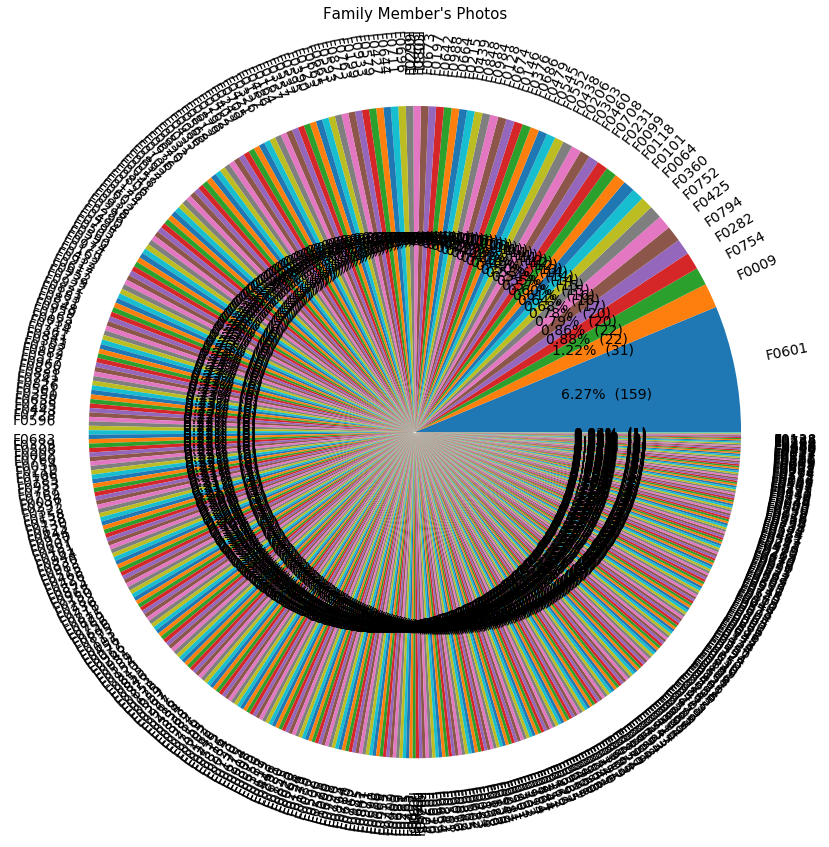

In [15]:
plt.figure(figsize=(15,15))

plt.pie(most_family_pics.values, labels=most_family_pics.index, radius=1, 
        autopct=lambda p : '{:.2f}%  ({:,.0f})'.format(p,p * sum(most_family_pics.values[:25])/100),
        textprops={'fontsize': 14, 'rotation_mode': 'anchor'},
        rotatelabels=True)
plt.title("Family Member's Photos", size=15)
plt.show;

In [146]:
#looking at the family with the most family members - family F0601

largest_family = train_df.loc[train_df.family == 'F0601']
one_pic_largest_family = largest_family.drop_duplicates(subset='member', keep='last')
one_pic_largest_family.head()

,file,family,member,family_member_id
5758,data/train/F0601/MID6/P06333_face2.jpg,F0601,MID6,F0601/MID6
5786,data/train/F0601/MID1/P06306_face3.jpg,F0601,MID1,F0601/MID1
5808,data/train/F0601/MID8/P06344_face1.jpg,F0601,MID8,F0601/MID8
5811,data/train/F0601/MID32/P06071_face7.jpg,F0601,MID32,F0601/MID32
5815,data/train/F0601/MID35/P06392_face3.jpg,F0601,MID35,F0601/MID35


In [127]:
# from PIL import Image
# # from IPython.display import Image
# # Image(filename=x)

Family with the most members: Royal Family, id: F0601


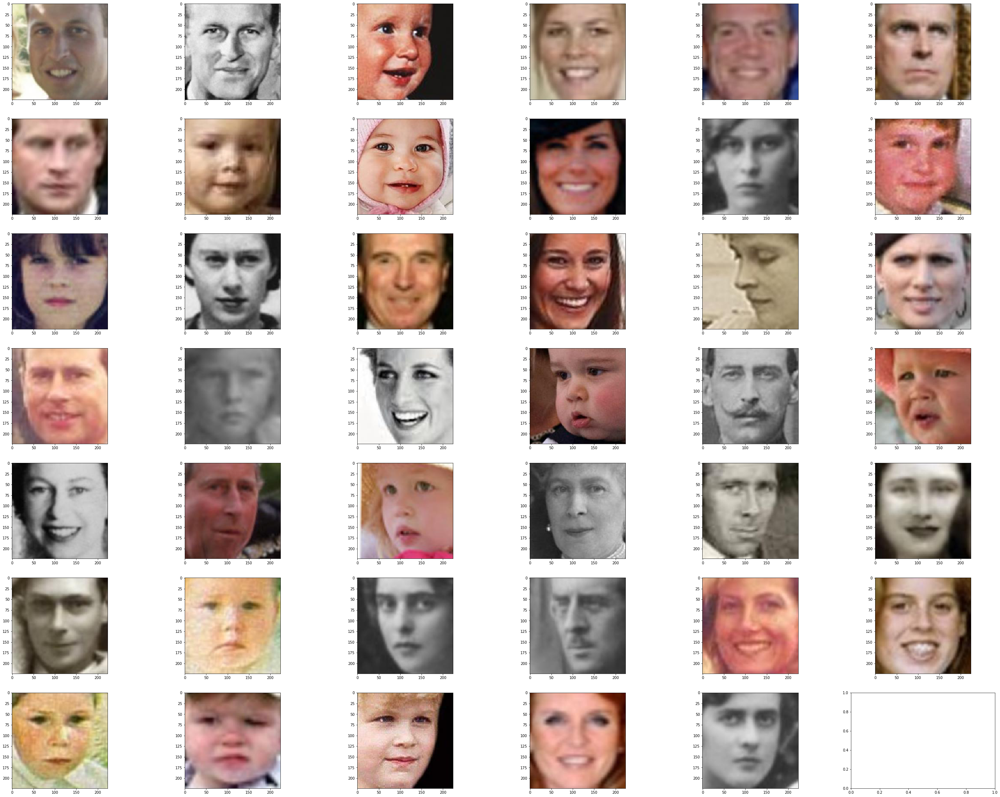

In [147]:
from PIL import Image
from matplotlib.pyplot import imshow
import numpy as np
%matplotlib inline

print("Family with the most members: Royal Family, id: F0601")

nrows = round(len(one_pic_largest_family.file.values) / 6) 
fig, ax = plt.subplots(nrows, 6, figsize=(50, 40))
row = 0
col = 0

for path in one_pic_largest_family.file.values:
    pil_im = Image.open(path, 'r')
    ax[row][col].imshow(np.asarray(pil_im))
    
    col += 1
    if col == 6:
        row += 1
        col = 0

Person with the most pictures: Prince William


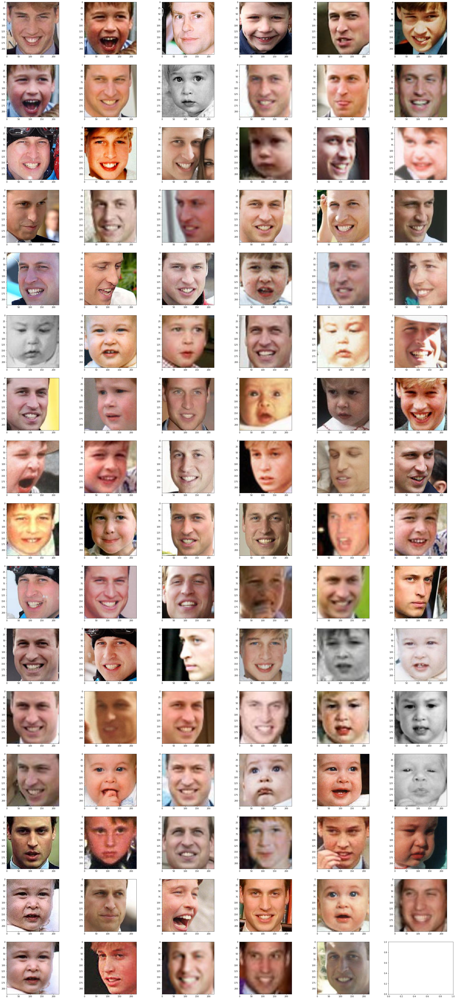

In [145]:
from PIL import Image
from matplotlib.pyplot import imshow
import numpy as np
%matplotlib inline

person_most_pics = train_df.loc[train_df.family_member_id == 'F0601/MID6']

print("Person with the most pictures: Prince William")

nrows = round(len(person_most_pics.file.values) / 6) 
fig, ax = plt.subplots(nrows, 6, figsize=(40, 90))
row = 0
col = 0

for path in person_most_pics.file.values:
    pil_im = Image.open(path, 'r')
    ax[row][col].imshow(np.asarray(pil_im))
    
    col += 1
    if col == 6:
        row += 1
        col = 0